In [163]:
import os
from collections import Counter
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.manifold import TSNE

%matplotlib inline
os.chdir('/Users/rudraksh/Google Drive/FlavorDB-Analysis')

import sys
sys.path.append('/Users/rudraksh/Google Drive/bio_corex')
import corex as ce

In [2]:
figloc = 'Manuscript/Figures/'
excel_writer = pd.ExcelWriter(figloc + 'STable.xlsx')

def set_style():
    plt.style.use(['seaborn-whitegrid'])
    sns.set_palette(sns.color_palette("Set2", 10)[::-1])
    
set_style()

label_size = 12
mpl.rcParams['xtick.labelsize'] = label_size 
mpl.rcParams['ytick.labelsize'] = label_size
mpl.rcParams['axes.labelsize'] = label_size + 3

# 1. Entity analysis

### Read data files.

In [3]:
# Entities main file.
entites = pd.read_csv('Data/FDB_entities.csv', encoding='ISO-8859-1')
entites.fillna('', inplace=True)

### Statistics

In [4]:
print("Total number of entities: %d" %len(set(entites['entity_id'])))
print("Total number of categories: %d" %len(set(entites['category_readable'])))
print("Total number of natural sources: %d" %len(set(entites['natural_source_name'])))

Total number of entities: 936
Total number of categories: 35
Total number of natural sources: 531


### Visualisations

##### Number of entities per category.

**a. Bar Chart**

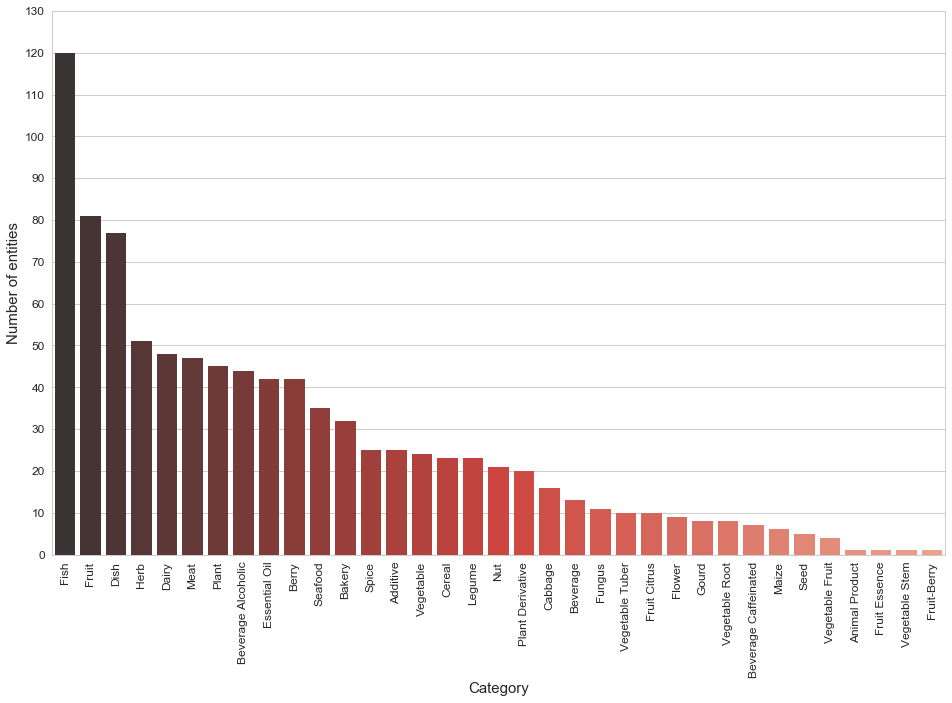

In [5]:
catg_num_entites = entites.groupby(['category_readable']).agg(len)[['entity_id']]\
.sort_values('entity_id', ascending=False).reset_index(drop=False)

plt.figure(figsize=(16,10))
sns.barplot(data=catg_num_entites, x='category_readable', y='entity_id', palette="Reds_d")
plt.yticks(np.arange(0,140,10))
plt.xticks(rotation=90)
plt.xlabel('Category')
plt.ylabel('Number of entities')
plt.savefig(figloc+'1_bar_num_entities_per_category.jpeg', dpi=300)

**b. Histogram**

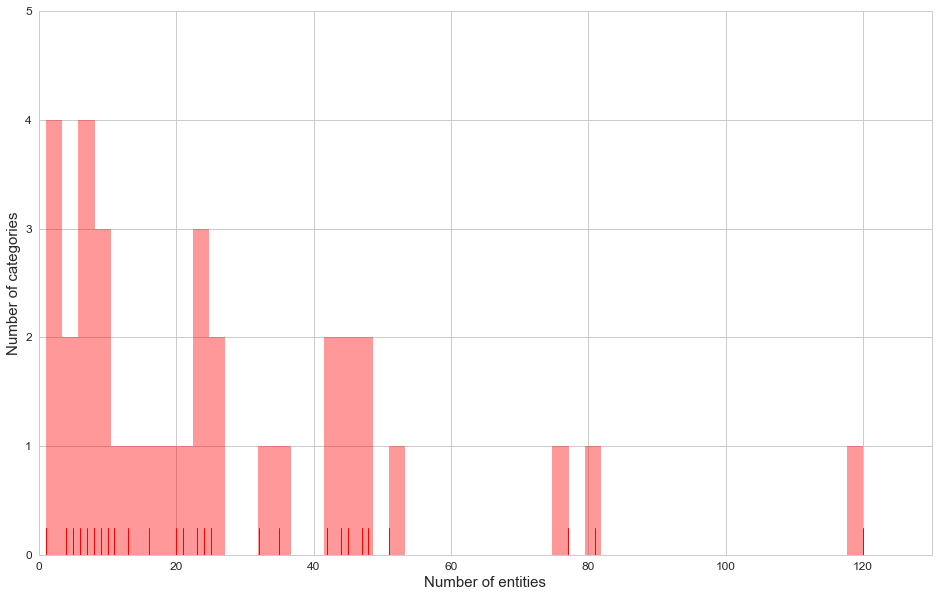

In [6]:
plt.figure(figsize=(16,10))
sns.distplot(catg_num_entites['entity_id'], color='Red', kde=False, rug=True, bins=50)
plt.xlabel('Number of entities')
plt.ylim(0,5)
plt.xlim((0,130))
plt.ylabel('Number of categories')
plt.savefig(figloc+'1_hist_num_entities_per_category.jpeg', dpi=300)

##### Number of natural sources per category

**a. Bar Chart**

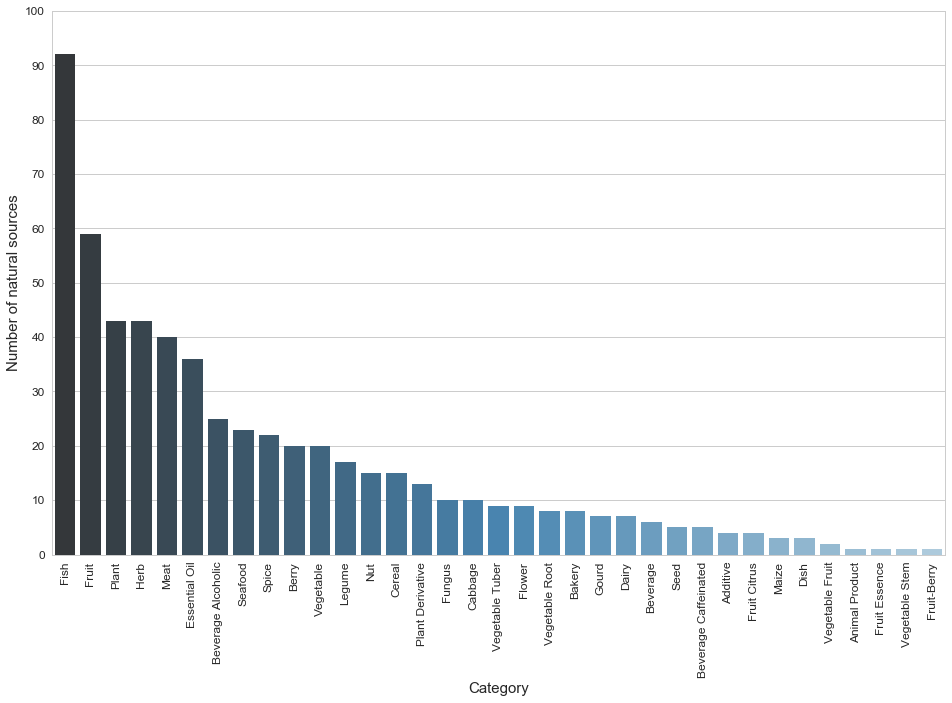

In [7]:
catg_num_nat =entites.groupby(['category_readable']).agg(lambda s: len(set([e for e in s if e != ''])))[['natural_source_name']]\
.sort_values('natural_source_name', ascending=False).reset_index(drop=False)

plt.figure(figsize=(16,10))
sns.barplot(data=catg_num_nat, x='category_readable', y='natural_source_name', palette="Blues_d")
plt.yticks(np.arange(0,110,10))
plt.xticks(rotation=90)
plt.xlabel('Category')
plt.ylabel('Number of natural sources')
plt.savefig(figloc+'2_bar_num_natsource_per_category.jpeg', dpi=300)

**b. Histogram**

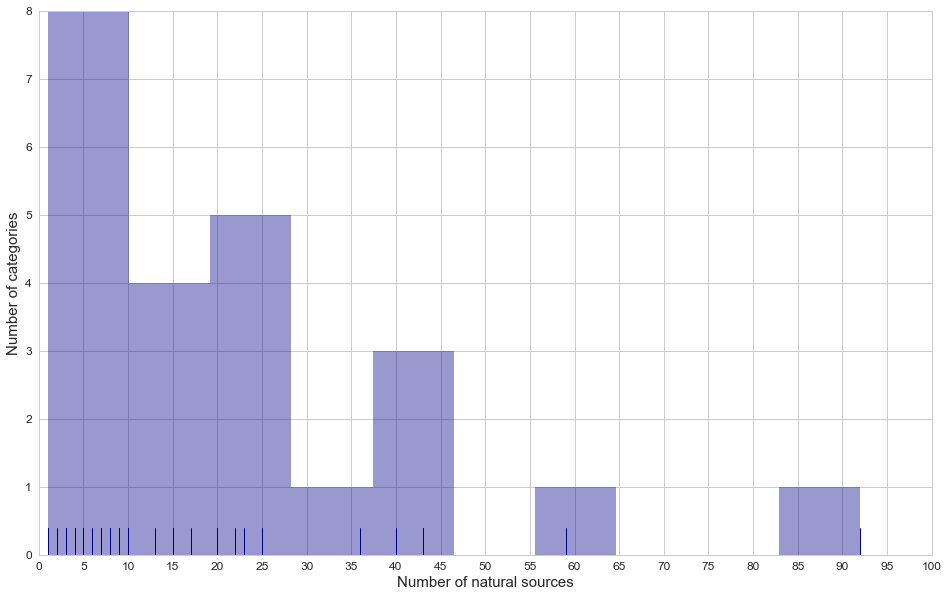

In [8]:
plt.figure(figsize=(16,10))
sns.distplot(catg_num_nat['natural_source_name'], color='DarkBlue', kde=False, rug=True)
plt.xlabel('Number of natural sources')
plt.xlim((0,100))
plt.xticks(np.arange(0,105,5))
plt.ylim(0,8)
plt.ylabel('Number of categories')
plt.savefig(figloc+'2_hist_num_natsource_per_category.jpeg', dpi=300)

##### Number of entities per natural source

**a. Bar chart**

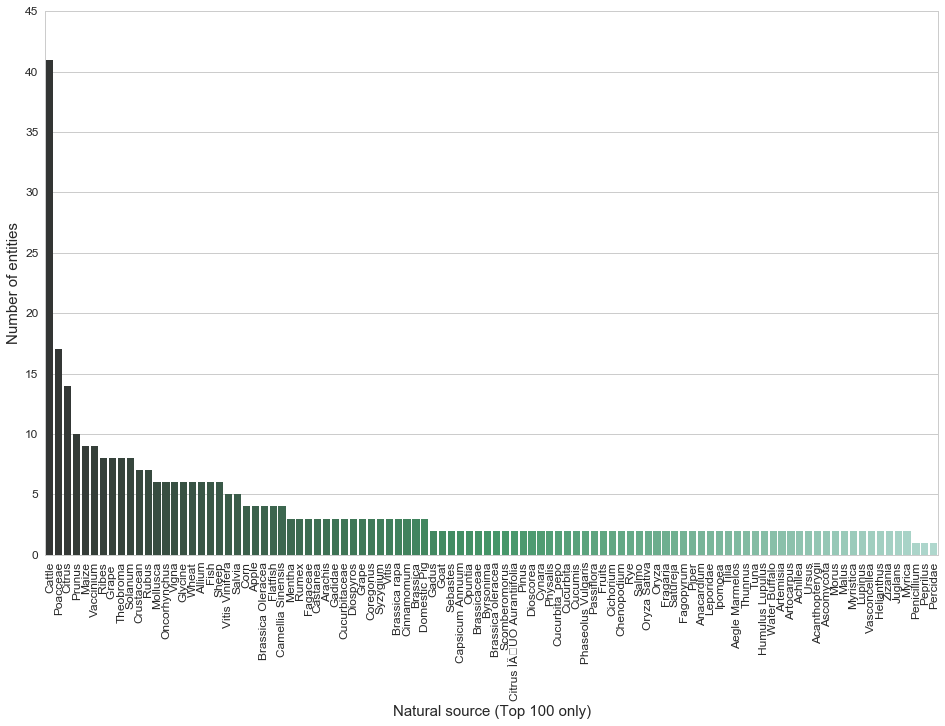

In [9]:
natsource_num_entities = entites[entites['natural_source_name'] != ''].groupby('natural_source_name').\
agg(len)[['entity_id']].sort_values('entity_id', ascending=False).reset_index()

plt.figure(figsize=(16,10))
sns.barplot(data=natsource_num_entities.iloc[:100], x='natural_source_name', y='entity_id', palette="BuGn_d")
plt.yticks(np.arange(0,50,5))
plt.xticks(rotation=90)
plt.xlabel('Natural source (Top 100 only)')
plt.ylabel('Number of entities')
plt.savefig(figloc+'3_bar_num_entites_per_natsource_top100.jpeg', dpi=300)

**b. Histogram **

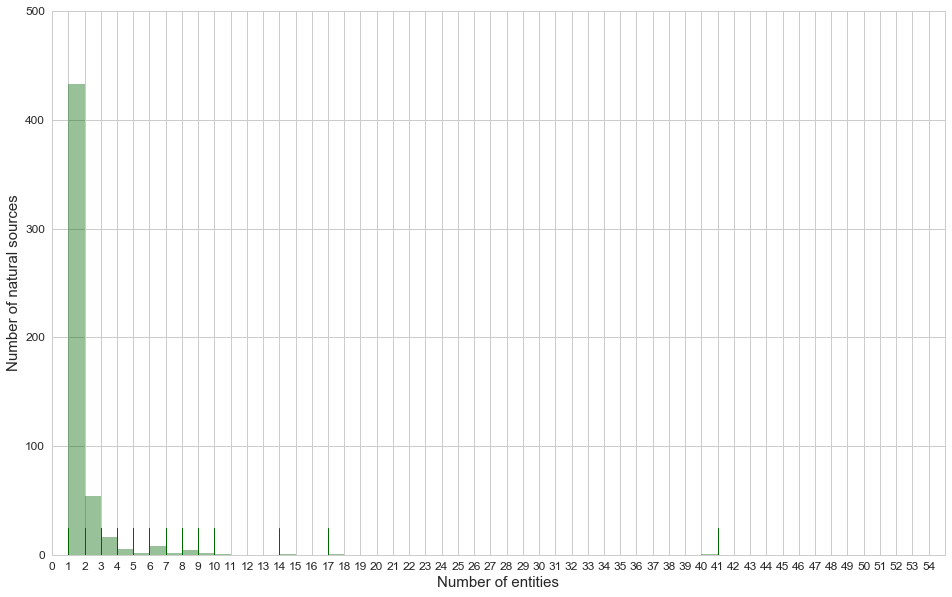

In [10]:
plt.figure(figsize=(16,10))
sns.distplot(natsource_num_entities['entity_id'], color='DarkGreen', kde=False, bins=40, rug=True)
plt.xlabel('Number of entities')
plt.xlim((0,55))
plt.xticks(np.arange(0,55,1))
plt.ylim(0,500)
plt.ylabel('Number of natural sources')
plt.savefig(figloc+'3_hist_num_entites_per_natsource.jpeg', dpi=300)

# 2. Molecular analysis

### Read Data Files.

In [11]:
# ADMET properties.
admet = pd.read_csv('Data/FDB_admet.tsv', sep='\t')

# 2d-3d properties.
twod_threed = pd.read_csv('Data/FDB_twod_threed.tsv', sep='\t')

# Pubchem properties
pubchem_prop = pd.read_csv('Data/FDB_pubchem_prop.tsv', sep='\t', index_col='Unnamed: 0')
pubchem_prop.fillna('', inplace=True)

# Drop certain columns

## Identifiers.
twod_threed.drop(['Molecular_Formula', 'Molecular_Composition'], inplace=True, axis=1)
pubchem_prop.drop(['IUPACName', 'common_name', 'CanonicalSMILES', 'IsomericSMILES',
                   'cas_id', 'fema_number', 'InChI'], 
                  inplace=True, axis=1)
admet.drop(['ADMET_BBB', 'ADMET_EXT_Hepatotoxic_Applicability', 'ADMET_EXT_PPB_Applicability'],
           inplace=True, axis=1)

## Large number of missing values or no variability.
twod_threed.drop(['pKa', 'Num_HydrogenBonds'], inplace=True, axis=1)

# Outlier data point.
# Set pubchem_id as index for each.
twod_threed = twod_threed.set_index('pubchem_id').drop([24763, 58059732, 4873, 24015, 59514401, 59514406], axis=0)
pubchem_prop = pubchem_prop.set_index('pubchem_id').drop([24763, 58059732, 4873, 24015, 59514401, 59514406], axis=0)
admet = admet.set_index('pubchem_id').drop([24763, 58059732, 4873, 24015, 59514401, 59514406], axis=0)

## a. Properties analysis

### Correlation matrix

#### 2D-3D properties

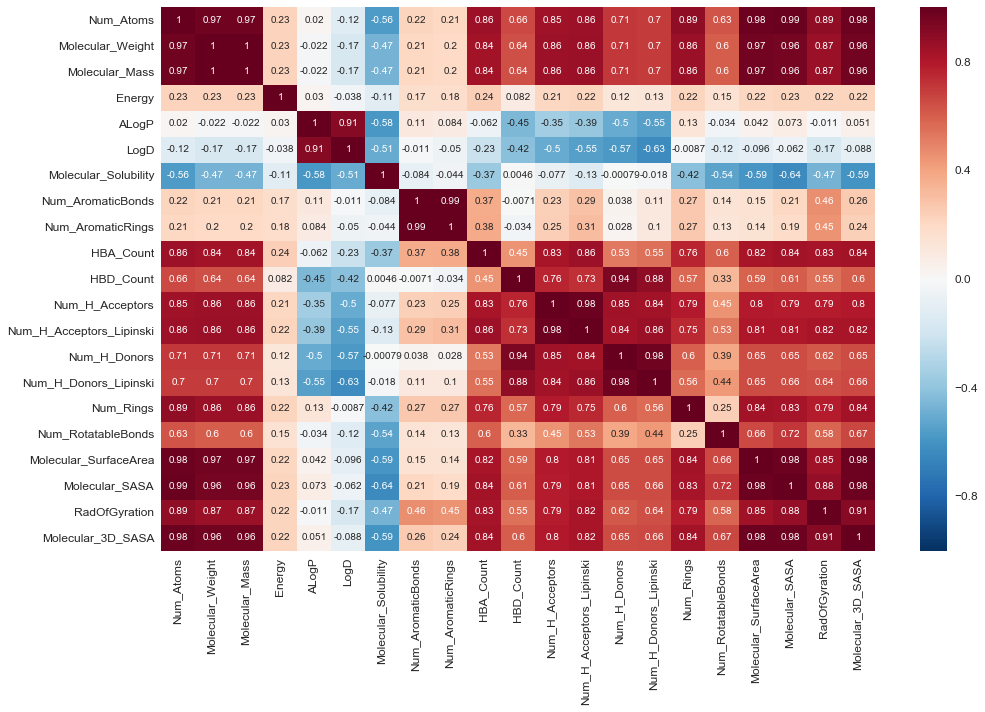

In [12]:
corr = twod_threed.corr()
plt.figure(figsize=(16,10))
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values,
            annot=True)

Redundant columns

In [13]:
corr_mod = pd.DataFrame(corr.values - np.eye(len(corr)), columns=corr.columns, index=corr.index)
for i,r in corr_mod.iterrows():
    print(r.name, '-', r.argmax(), r.max())
        
red_twod_threed = ['Molecular_SASA', 'Molecular_3D_SASA', 'Molecular_Mass', 'Num_AromaticBonds', 'Num_H_Acceptors_Lipinski',
                   'Num_H_Donors_Lipinski', 'Molecular_SurfaceArea', 'Molecular_Weight']

Num_Atoms - Molecular_SASA 0.988187892347
Molecular_Weight - Molecular_Mass 0.999999533188
Molecular_Mass - Molecular_Weight 0.999999533188
Energy - HBA_Count 0.244954335381
ALogP - LogD 0.912965746162
LogD - ALogP 0.912965746162
Molecular_Solubility - HBD_Count 0.00457880895154
Num_AromaticBonds - Num_AromaticRings 0.993754495902
Num_AromaticRings - Num_AromaticBonds 0.993754495902
HBA_Count - Num_Atoms 0.856975490452
HBD_Count - Num_H_Donors 0.942147933031
Num_H_Acceptors - Num_H_Acceptors_Lipinski 0.981846471249
Num_H_Acceptors_Lipinski - Num_H_Acceptors 0.981846471249
Num_H_Donors - Num_H_Donors_Lipinski 0.975398021403
Num_H_Donors_Lipinski - Num_H_Donors 0.975398021403
Num_Rings - Num_Atoms 0.887244371502
Num_RotatableBonds - Molecular_SASA 0.717935499661
Molecular_SurfaceArea - Molecular_3D_SASA 0.981292190359
Molecular_SASA - Num_Atoms 0.988187892347
RadOfGyration - Molecular_3D_SASA 0.912022149331
Molecular_3D_SASA - Num_Atoms 0.981979291504


#### ADMET properties

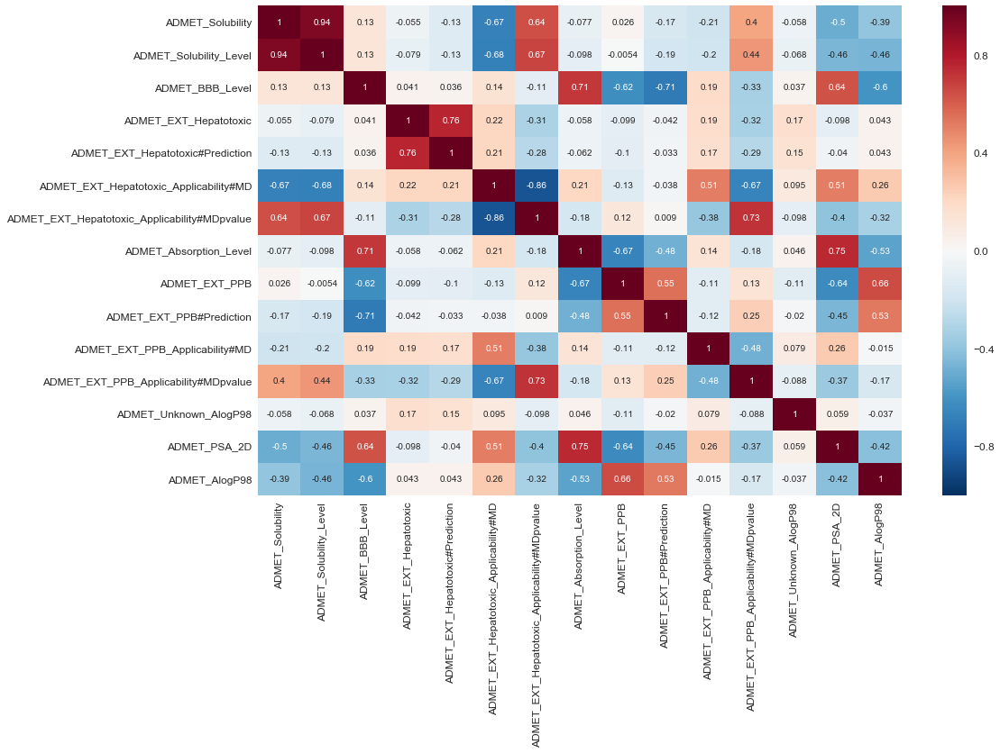

In [14]:
corr = admet.corr()
plt.figure(figsize=(16,10))
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values,
            annot=True)

In [15]:
corr_mod = pd.DataFrame(corr.values - np.eye(len(corr)), columns=corr.columns, index=corr.index)
for i,r in corr_mod.iterrows():
    print(r.name, '-', r.argmax(), r.max())
        
red_admet = ['ADMET_Solubility_Level']

ADMET_Solubility - ADMET_Solubility_Level 0.936630947993
ADMET_Solubility_Level - ADMET_Solubility 0.936630947993
ADMET_BBB_Level - ADMET_Absorption_Level 0.708397936312
ADMET_EXT_Hepatotoxic - ADMET_EXT_Hepatotoxic#Prediction 0.764505817806
ADMET_EXT_Hepatotoxic#Prediction - ADMET_EXT_Hepatotoxic 0.764505817806
ADMET_EXT_Hepatotoxic_Applicability#MD - ADMET_EXT_PPB_Applicability#MD 0.513313291596
ADMET_EXT_Hepatotoxic_Applicability#MDpvalue - ADMET_EXT_PPB_Applicability#MDpvalue 0.726203446927
ADMET_Absorption_Level - ADMET_PSA_2D 0.753319189352
ADMET_EXT_PPB - ADMET_AlogP98 0.655871910942
ADMET_EXT_PPB#Prediction - ADMET_EXT_PPB 0.553258997798
ADMET_EXT_PPB_Applicability#MD - ADMET_EXT_Hepatotoxic_Applicability#MD 0.513313291596
ADMET_EXT_PPB_Applicability#MDpvalue - ADMET_EXT_Hepatotoxic_Applicability#MDpvalue 0.726203446927
ADMET_Unknown_AlogP98 - ADMET_EXT_Hepatotoxic 0.171329163116
ADMET_PSA_2D - ADMET_Absorption_Level 0.753319189352
ADMET_AlogP98 - ADMET_EXT_PPB 0.655871910942


#### Pubchem properties

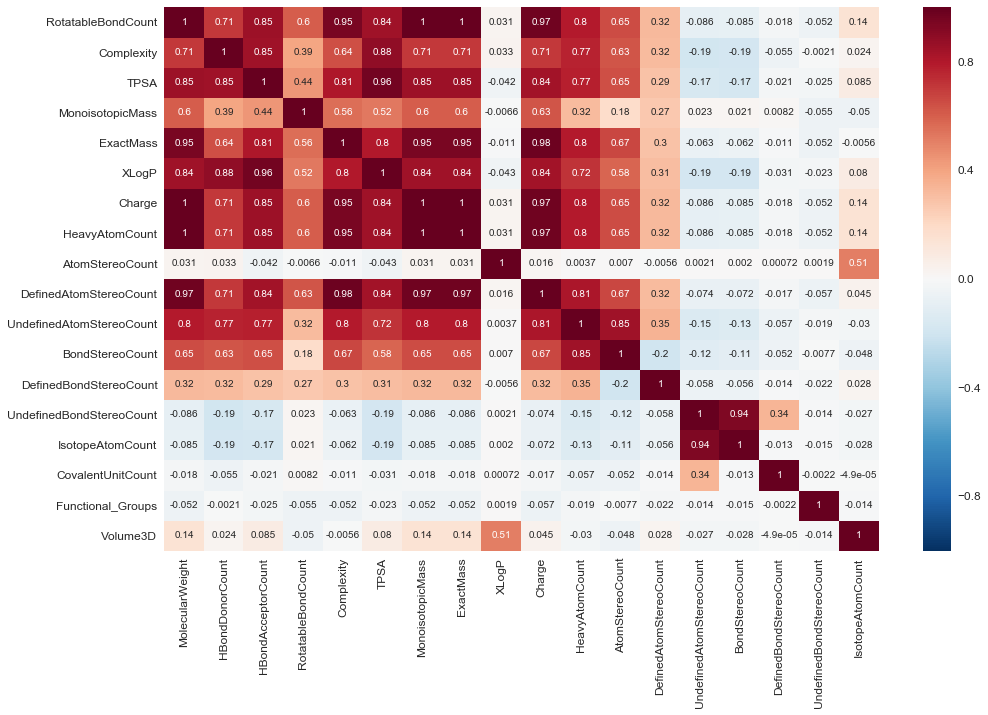

In [16]:
x = pubchem_prop.drop(['Bitter', 'fema_flavor_profile', 'odor', 'taste', 'fooddb_flavor_profile', 'SuperSweet'], 
                      axis=1)
corr = x.corr()
plt.figure(figsize=(16,10))
sns.heatmap(corr, 
            xticklabels=x.columns.values,
            yticklabels=x.columns.values,
            annot=True)

In [17]:
corr_mod = pd.DataFrame(corr.values - np.eye(len(corr)), columns=corr.columns, index=corr.index)
for i,r in corr_mod.iterrows():
    print(r.name, '-', r.argmax(), r.max())
        
#red_pubchem_prop = ['ExactMass', 'TPSA', 'Bitter', 'fema_flavor_profile', 'odor', 'taste', 
# 'fooddb_flavor_profile', 'SuperSweet' ]

MolecularWeight - ExactMass 0.999999646669
HBondDonorCount - TPSA 0.8849291937
HBondAcceptorCount - TPSA 0.964875721716
RotatableBondCount - HeavyAtomCount 0.627422696144
Complexity - HeavyAtomCount 0.977614284707
TPSA - HBondAcceptorCount 0.964875721716
MonoisotopicMass - ExactMass 0.999999892046
ExactMass - MonoisotopicMass 0.999999892046
Charge - CovalentUnitCount 0.5132794195
HeavyAtomCount - Complexity 0.977614284707
AtomStereoCount - DefinedAtomStereoCount 0.848403045555
DefinedAtomStereoCount - AtomStereoCount 0.848403045555
UndefinedAtomStereoCount - AtomStereoCount 0.349497278428
BondStereoCount - DefinedBondStereoCount 0.935145617344
DefinedBondStereoCount - BondStereoCount 0.935145617344
UndefinedBondStereoCount - BondStereoCount 0.342302945382
IsotopeAtomCount - Charge 0.00189793853303
CovalentUnitCount - Charge 0.5132794195


### Pairplots

Sweet-like molecules are removed

In [18]:
label = []
tokeep = []
for i,row in pubchem_prop.iterrows():
    if row['SuperSweet'] != 'Sweet-like':
        tokeep.append(i)
        
        l = ''

        if row['Bitter'] == True:
            l = 'Bitter'
        elif row['SuperSweet'] == 'Sweet':
            l = 'Sweet'

        if row['fema_flavor_profile'] != '' or (row['odor'] != '') or (row['fooddb_flavor_profile'] != ''):
            if l:
                l += ' & Odor'
            else:
                l = 'Odor'

        if not l:
            l = 'Other'

        label.append(l)

#### 2d-3d properties

In [50]:
x = twod_threed.drop(red_twod_threed,axis=1).loc[tokeep]
x['Label'] = label

sns.set(style="ticks", color_codes=True)
g = sns.pairplot(x, hue='Label',palette={'Sweet':'DarkGreen', 'Sweet & Odor':'LightGreen',
                                         'Bitter':'DarkBlue', 'Bitter & Odor':'LightBlue',
                                         'Odor':'Red', 'Other':'Yellow'},
             size=10, diag_kind="hist")


handles = g._legend_data.values()
labels = g._legend_data.keys()
#g.fig.legend(handles=handles, labels=labels, loc='upper center', ncol=1)
g.fig.legend(handles=handles, labels=labels, loc='lower center', ncol=3)
#g.fig.legend(handles=handles, labels=labels, loc='upper left', ncol=3)
g.fig.subplots_adjust(top=0.92, bottom=0.08)


#### ADMET properties

In [54]:
x = admet.drop(red_admet,axis=1).loc[tokeep]
x['Label'] = label

sns.set(style="ticks", color_codes=True)
g = sns.pairplot(x, hue='Label',palette={'Sweet':'DarkGreen', 'Sweet & Odor':'LightGreen',
                                         'Bitter':'DarkBlue', 'Bitter & Odor':'LightBlue',
                                         'Odor':'Red', 'Other':'Yellow'},
             size=10, diag_kind="hist")


handles = g._legend_data.values()
labels = g._legend_data.keys()
#g.fig.legend(handles=handles, labels=labels, loc='upper center', ncol=1)
g.fig.legend(handles=handles, labels=labels, loc='lower center', ncol=3)
#g.fig.legend(handles=handles, labels=labels, loc='upper left', ncol=3)
g.fig.subplots_adjust(top=0.92, bottom=0.08)


## b. Lower dimensional visualisation

In [21]:
# Merge 2d-3d properties and admet properties.
consolidated = pd.concat([admet.loc[tokeep], twod_threed.drop(red_twod_threed, axis=1).loc[tokeep]], axis=1)
consolidated['Label'] = label

# Drop certain columns.
consolidated.drop(['ADMET_EXT_Hepatotoxic#Prediction', 'ADMET_EXT_Hepatotoxic_Applicability#MDpvalue',
                   'ADMET_EXT_PPB#Prediction', 'ADMET_EXT_PPB_Applicability#MDpvalue'], axis=1, inplace=True)

# Print properties used.
consolidated.columns

Index(['ADMET_Solubility', 'ADMET_Solubility_Level', 'ADMET_BBB_Level',
       'ADMET_EXT_Hepatotoxic', 'ADMET_EXT_Hepatotoxic_Applicability#MD',
       'ADMET_Absorption_Level', 'ADMET_EXT_PPB',
       'ADMET_EXT_PPB_Applicability#MD', 'ADMET_Unknown_AlogP98',
       'ADMET_PSA_2D', 'ADMET_AlogP98', 'Num_Atoms', 'Energy', 'ALogP', 'LogD',
       'Molecular_Solubility', 'Num_AromaticRings', 'HBA_Count', 'HBD_Count',
       'Num_H_Acceptors', 'Num_H_Donors', 'Num_Rings', 'Num_RotatableBonds',
       'RadOfGyration', 'Label'],
      dtype='object')

In [22]:
tsne = TSNE(n_components=2, random_state=99, perplexity=30, verbose=True)

# Center and normalize data.
val = consolidated.drop('Label', axis=1).values
val = (val - val.mean(axis=0)) / val.std(axis=0)

# Transform to 2-D points.
std_val = tsne.fit_transform(val)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 11805 samples in 0.076s...
[t-SNE] Computed neighbors for 11805 samples in 10.418s...
[t-SNE] Computed conditional probabilities for sample 1000 / 11805
[t-SNE] Computed conditional probabilities for sample 2000 / 11805
[t-SNE] Computed conditional probabilities for sample 3000 / 11805
[t-SNE] Computed conditional probabilities for sample 4000 / 11805
[t-SNE] Computed conditional probabilities for sample 5000 / 11805
[t-SNE] Computed conditional probabilities for sample 6000 / 11805
[t-SNE] Computed conditional probabilities for sample 7000 / 11805
[t-SNE] Computed conditional probabilities for sample 8000 / 11805
[t-SNE] Computed conditional probabilities for sample 9000 / 11805
[t-SNE] Computed conditional probabilities for sample 10000 / 11805
[t-SNE] Computed conditional probabilities for sample 11000 / 11805
[t-SNE] Computed conditional probabilities for sample 11805 / 11805
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergenc

In [46]:
# Append labels
df = pd.DataFrame(std_val, columns=["x", "y"])
df['Label'] = label

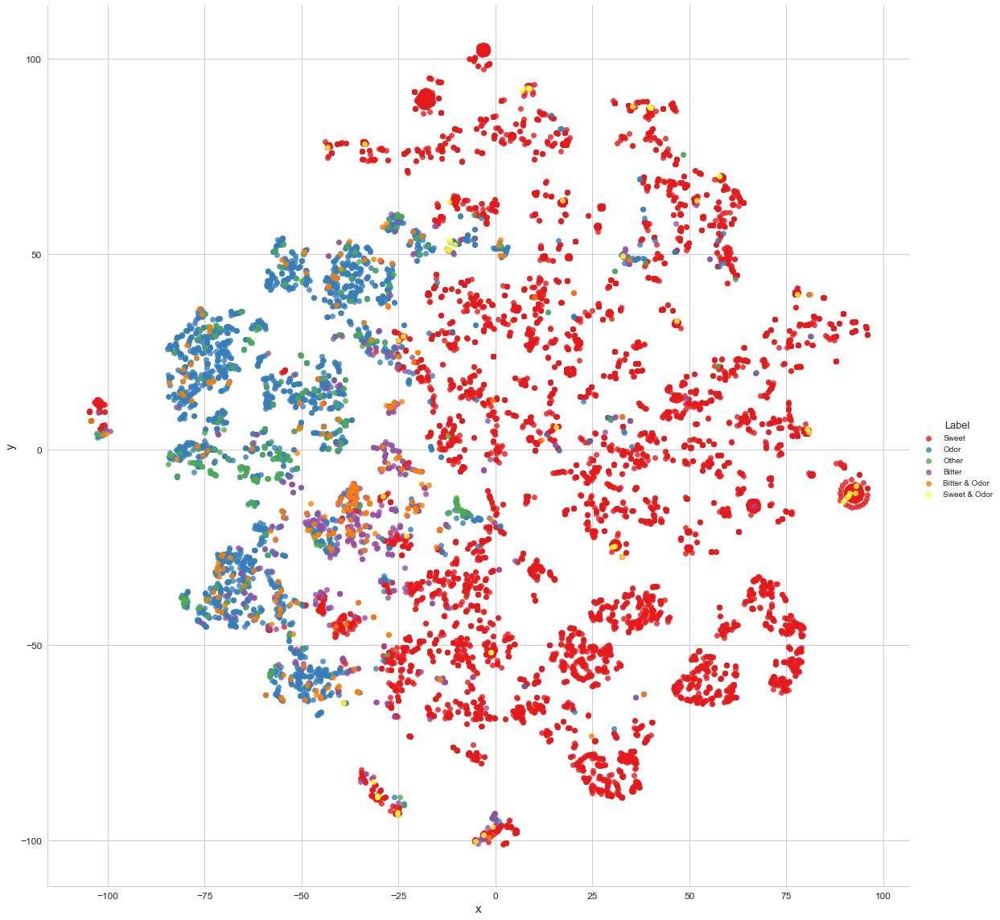

In [54]:
# Plot in 2D.
sns.lmplot(data=df, x="x", y="y", fit_reg=False, hue='Label', size=16, palette="Set1")
plt.show()

## c. Flavor information characteristisation

###  Basic Statistics

#### a. Count of different flavors and overlap

In [55]:
fooddb_odor = list(pubchem_prop[pubchem_prop['fooddb_flavor_profile'] != ''].index)
print("Total FoodDB Odor molecules: %d" %len(fooddb_odor))

pubchem_odor = list(pubchem_prop[pubchem_prop['odor'] != ''].index)
print("Total PubChem odor molecules: %d" %len(pubchem_odor))

pubchem_taste = list(pubchem_prop[pubchem_prop['taste'] != ''].index)
print("Total PubChem taste molecules: %d" %len(pubchem_taste))

sweet_like = list(pubchem_prop[pubchem_prop['SuperSweet'] == 'Sweet-like'].index)
sweet = list(pubchem_prop[pubchem_prop['SuperSweet'] == 'Sweet'].index)
print("Total Sweet molecules: %d " %len(sweet))
print("Total Sweet-like molecules: %d" %len(sweet_like))

bitter = list(pubchem_prop[pubchem_prop['Bitter'].tolist()].index)
print("Total Bitter molecules: %d" %len(bitter))

fema = list(pubchem_prop[pubchem_prop['fema_flavor_profile'] != ''].index)
print("Total FEMA molecules: %d" %len(fema))

Total FoodDB Odor molecules: 2680
Total PubChem odor molecules: 543
Total PubChem taste molecules: 414
Total Sweet molecules: 8192 
Total Sweet-like molecules: 13784
Total Bitter molecules: 663
Total FEMA molecules: 1808


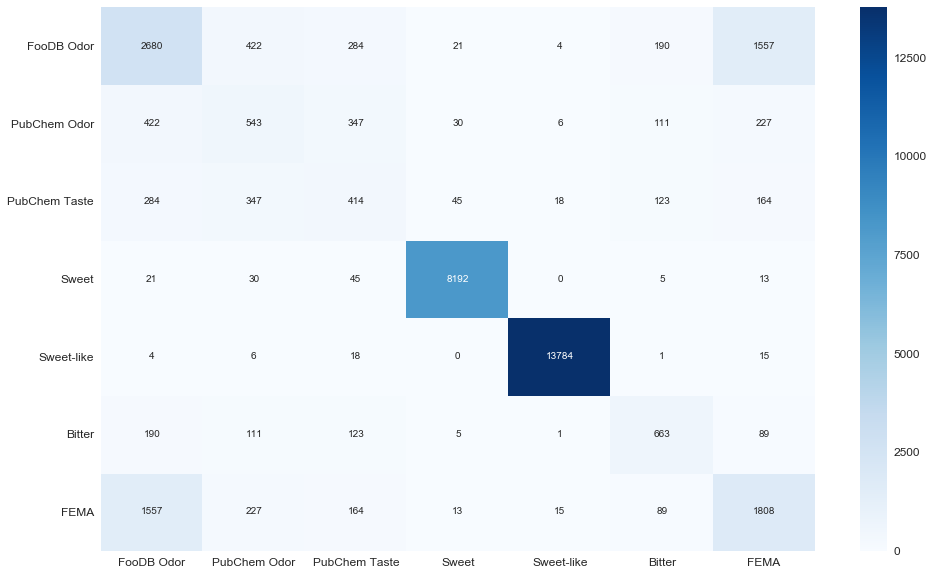

In [56]:
x = [fooddb_odor, pubchem_odor, pubchem_taste, sweet, sweet_like, bitter, fema]
conf = np.zeros((len(x), len(x)))

for i,mol_list_1 in enumerate(x):
    for j,mol_list_2 in enumerate(x):
        mol_list_1 = set(mol_list_1)
        mol_list_2 = set(mol_list_2)
        
        conf[i,j] = len(mol_list_1.intersection(mol_list_2))
        
c = ['FooDB Odor', 'PubChem Odor', 'PubChem Taste', 'Sweet', 'Sweet-like', 'Bitter', 'FEMA']
df = pd.DataFrame(conf, columns=c, index=c, dtype=int)
plt.figure(figsize=(16,10))
sns.heatmap(df.values, annot=True, fmt="d", cmap="Blues", 
            xticklabels=c, yticklabels=c)

##### Preprocessing
* A new odor column is created by combining "FoodDB Odor" and "PubChem Odor".
* A new taste column is created by combining "Sweet" molecules and "Bitter" molecules.
* Sweet-like molecules are not considered for further analysis since they are found using structural similarity.
* PubChem taste is not considered because of high dimensionality and being limited to just a few molecules.
* FEMA is discarded because of no clear distinction being made between Odor and Taste, as well no source info being present

In [206]:
newodor = (pubchem_prop['fooddb_flavor_profile'].map(lambda s: s.split('@')) + \
pubchem_prop['odor'].map(lambda s: s.split('@'))).tolist()

newodor = [o.lower() for odor_list in newodor for o in odor_list if o != '']
newodor_counts = pd.DataFrame(list(Counter(newodor).items()), columns=['Odor', 'Frequency']).sort_values('Frequency',
                                                                                                         ascending=False)
newodor_counts.head(10)

,Odor,Frequency
5,fruity,642
16,sweet,626
3,green,540
1,floral,310
48,odorless,287
34,bitter,258
44,woody,243
15,herbal,222
118,waxy,211
26,fatty,191


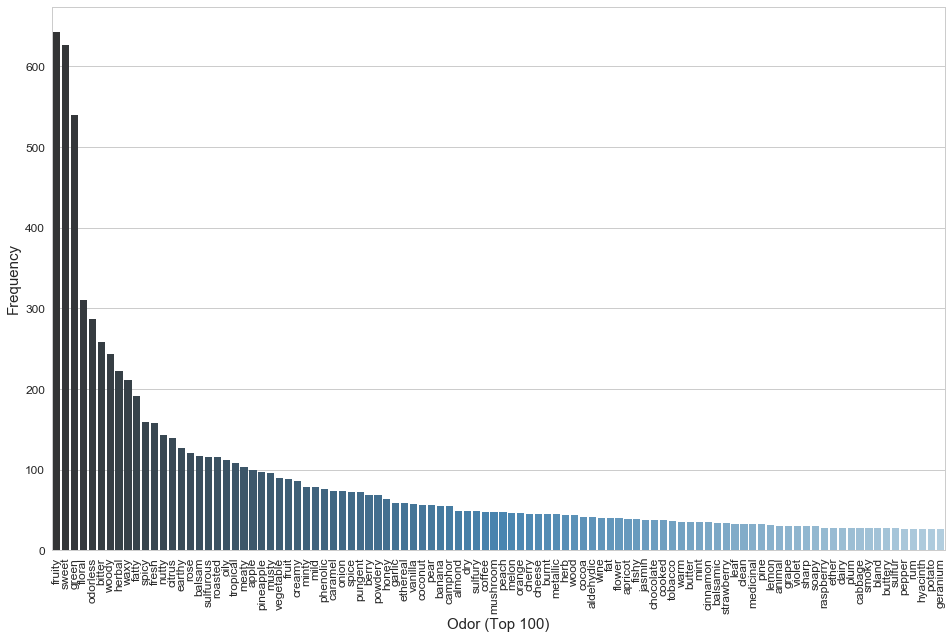

In [207]:
plt.figure(figsize=(16,10))
sns.barplot(data=newodor_counts.iloc[:100], x='Odor', y='Frequency', palette="Blues_d")
plt.xticks(rotation=90)
plt.ylabel('Frequency')
plt.xlabel('Odor (Top 100)')

(0, 700)

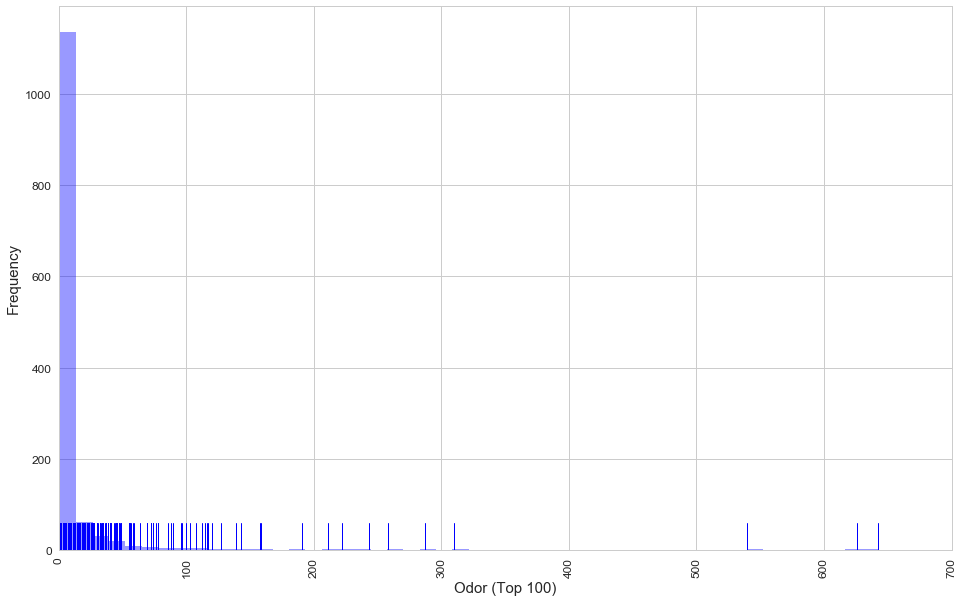

In [208]:
plt.figure(figsize=(16,10))
sns.distplot(newodor_counts['Frequency'], color="Blue", kde=False, rug=True)
plt.xticks(rotation=90)
plt.ylabel('Frequency')
plt.xlabel('Odor (Top 100)')
plt.xlim(0,700)

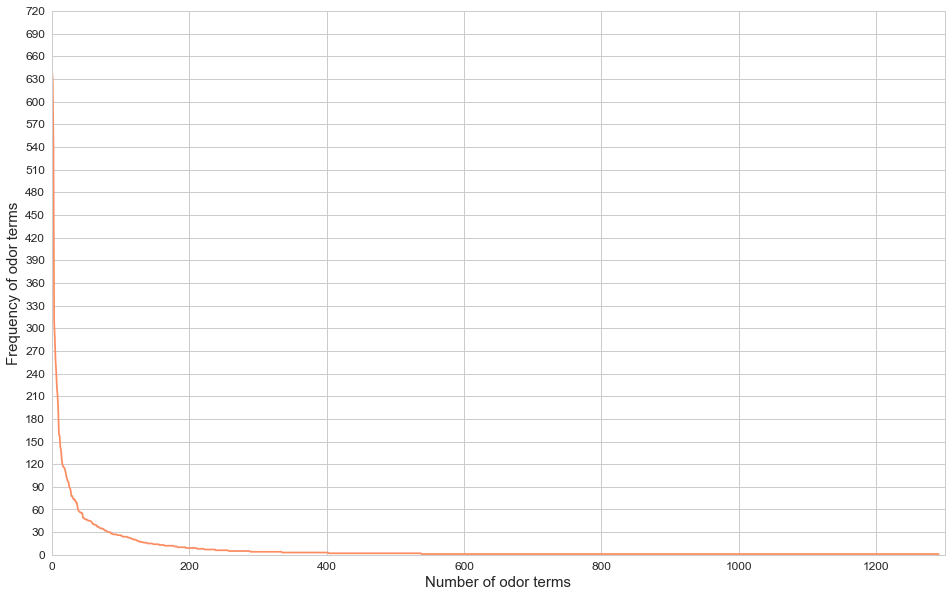

In [209]:
plt.figure(figsize=(16,10))
plt.plot(list(range(len(newodor_counts))), newodor_counts['Frequency'], )
plt.ylim(0,700)
plt.xlim(0,1300)
plt.yticks(np.arange(0,750,30))
plt.ylabel("Frequency of odor terms")
plt.xlabel("Number of odor terms")
plt.show()

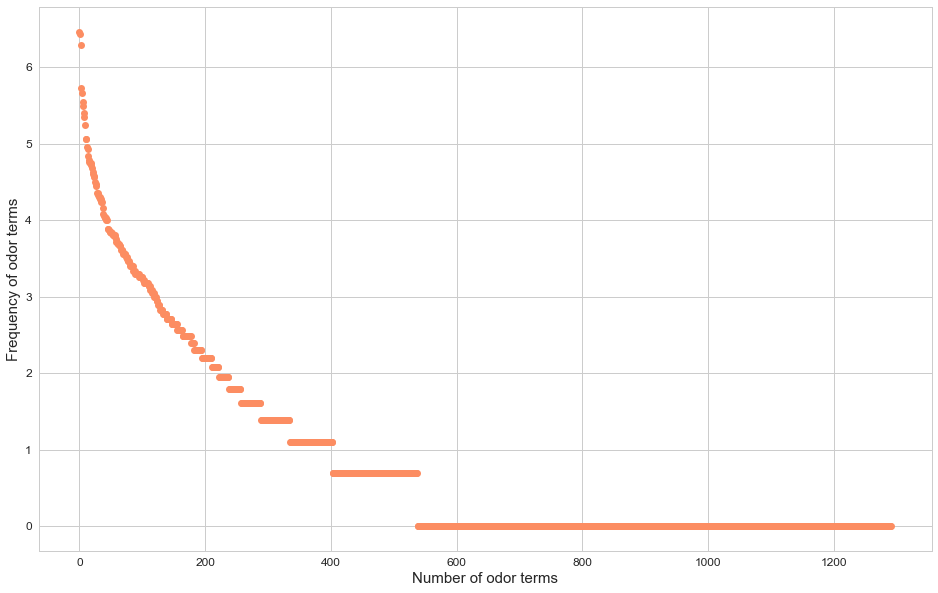

In [210]:
newodor_counts['Frequency'] = newodor_counts['Frequency'].apply(np.log)
plt.figure(figsize=(16,10))
plt.plot(list(range(len(newodor_counts))), newodor_counts['Frequency'], "o")
#plt.ylim(0,700)
#plt.xlim(0,1300)
#plt.yticks(np.arange(0,750,30))
plt.ylabel("Frequency of odor terms")
plt.xlabel("Number of odor terms")
plt.show()

### e. Odor Molecule clustering

In [223]:
newodor = (pubchem_prop['fooddb_flavor_profile'].map(lambda s: s.split('@')) + \
pubchem_prop['odor'].map(lambda s: s.split('@'))).tolist()

pubchem_prop['New Odor'] = newodor
pubchem_prop['New Odor']= pubchem_prop['New Odor'].map(lambda s: ', '.join([e.lower() for e in s if e != '']))

odor_mol = pubchem_prop[pubchem_prop['New Odor'] != '']

In [231]:
from gensim import corpora, models

molecules = odor_mol['New Odor'].map(lambda s: s.split(', ')).tolist()
dictionary = corpora.Dictionary(molecules)
corpus = [dictionary.doc2bow(mol) for mol in molecules]

In [235]:
ldamodel = models.ldamodel.LdaModel(corpus, num_topics=10, id2word = dictionary, passes=20)

In [248]:
ldamodel.print_topics()

[(0,
  '0.106*"green" + 0.086*"fatty" + 0.058*"waxy" + 0.049*"citrus" + 0.042*"floral" + 0.040*"oily" + 0.039*"fresh" + 0.038*"fruity" + 0.020*"rose" + 0.019*"earthy"'),
 (1,
  '0.110*"woody" + 0.105*"herbal" + 0.054*"sweet" + 0.043*"floral" + 0.041*"minty" + 0.039*"spice" + 0.035*"spicy" + 0.029*"wood" + 0.029*"green" + 0.027*"fresh"'),
 (2,
  '0.099*"sweet" + 0.060*"mild" + 0.047*"floral" + 0.047*"honey" + 0.032*"fruity" + 0.027*"rose" + 0.026*"balsam" + 0.018*"waxy" + 0.016*"anise" + 0.016*"alcoholic"'),
 (3,
  '0.087*"sweet" + 0.049*"spicy" + 0.049*"balsam" + 0.043*"vanilla" + 0.038*"pungent" + 0.033*"powdery" + 0.029*"almond" + 0.026*"phenolic" + 0.026*"sharp" + 0.022*"balsamic"'),
 (4,
  '0.206*"fruity" + 0.097*"sweet" + 0.072*"green" + 0.041*"apple" + 0.041*"tropical" + 0.039*"pineapple" + 0.030*"fruit" + 0.028*"floral" + 0.026*"berry" + 0.024*"banana"'),
 (5,
  '0.277*"odorless" + 0.253*"bitter" + 0.023*"animal" + 0.022*"medicinal" + 0.021*"alkane" + 0.018*"phenolic" + 0.015*"m

In [274]:
topics = list()
for i,t in enumerate(ldamodel.get_document_topics(corpus)):
    topics.append(dict(t))
    
topics = pd.DataFrame(topics).fillna(0)
topics.index = odor_mol.index

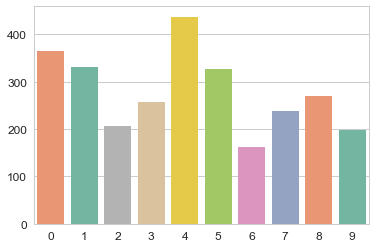

In [283]:
sns.barplot(y=topics.sum().tolist(), x=list(range(10)))

# 3. Entity-Molecule association analysis

### Read data files

In [112]:
# Read mapping from entitiy to molecules.
entmol = pd.read_csv('Data/FDB_molecules_entities.csv', encoding='utf-8')

# Get categoruy information
entid2catg =entites.set_index('entity_id').to_dict()['category_readable']
entmol['category'] = entmol['fdb_entities_id'].map(lambda s: entid2catg[s])

# Get Natural source information.
entid2natsource =entites.set_index('entity_id').to_dict()['natural_source_name']
entmol['natural_source'] = entmol['fdb_entities_id'].map(lambda s: entid2natsource[s])

### Statistics

In [128]:
print("%d entites associated with %d molecules." %(len(set(entmol['fdb_entities_id'])), 
                                                   len(set(entmol['fdb_molecules_id']))))
print("Total entity to molecule mappings: %d" %len(entmol))
print("Total category to molecule mappings: %d" %entmol.groupby('category').agg(lambda s: len(set(s)))\
      ['fdb_molecules_id'].sum())
print("Total natural source to molecule mappings: %d" %entmol.groupby('natural_source').agg(lambda s: len(set(s)))\
      ['fdb_molecules_id'].sum())

936 entites associated with 1788 molecules.
Total entity to molecule mappings: 60263
Total category to molecule mappings: 11193
Total natural source to molecule mappings: 43933


### Visualizations

##### Barchart - Number of molecules for each entity

In [141]:
ent2molcount = entmol.groupby('fdb_entities_id').agg(len)[['fdb_molecules_id']]
entid2name = entites.set_index('entity_id').to_dict()['entity_alias_readable']
ent2molcount['entity'] = ent2molcount.index.map(lambda s: entid2name[s])
ent2molcount.reset_index(drop=True, inplace=True)
ent2molcount.sort_values('fdb_molecules_id', ascending=False, inplace=True)

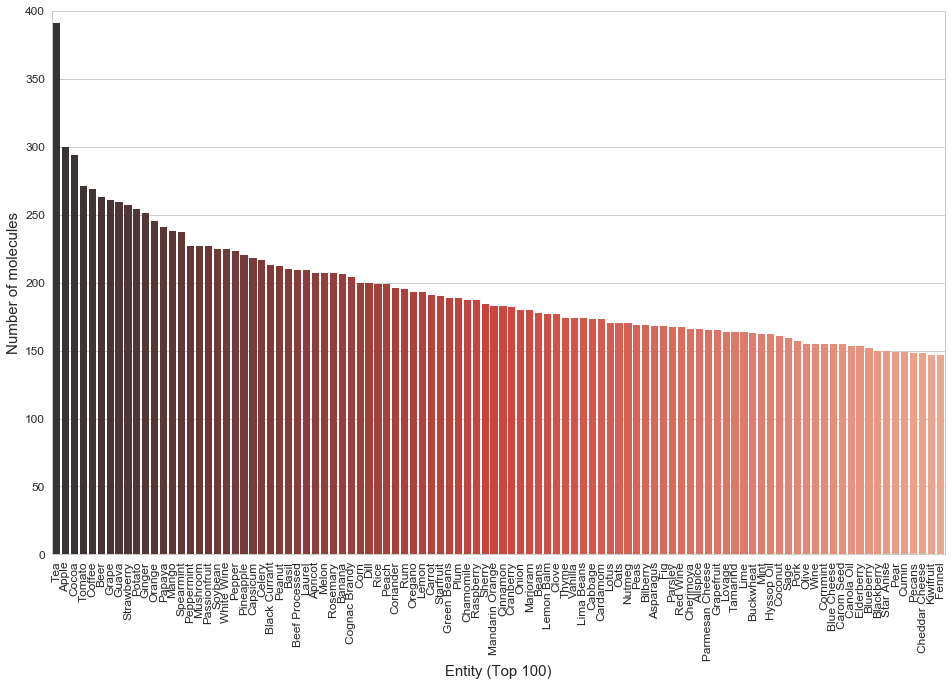

In [159]:
plt.figure(figsize=(16,10))
sns.barplot(data=ent2molcount.iloc[:100], x='entity', y='fdb_molecules_id', palette="Reds_d")
plt.xticks(rotation=90)
plt.xlabel('Entity (Top 100)')
plt.ylim(0,400)
plt.ylabel('Number of molecules')

##### Barchart - Number of molecules for each category

In [153]:
catg2molcount = entmol.groupby('category').agg(lambda s: len(set(s)))[['fdb_molecules_id']]
catg2molcount.reset_index(inplace=True)
catg2molcount.sort_values('fdb_molecules_id', ascending=False, inplace=True)

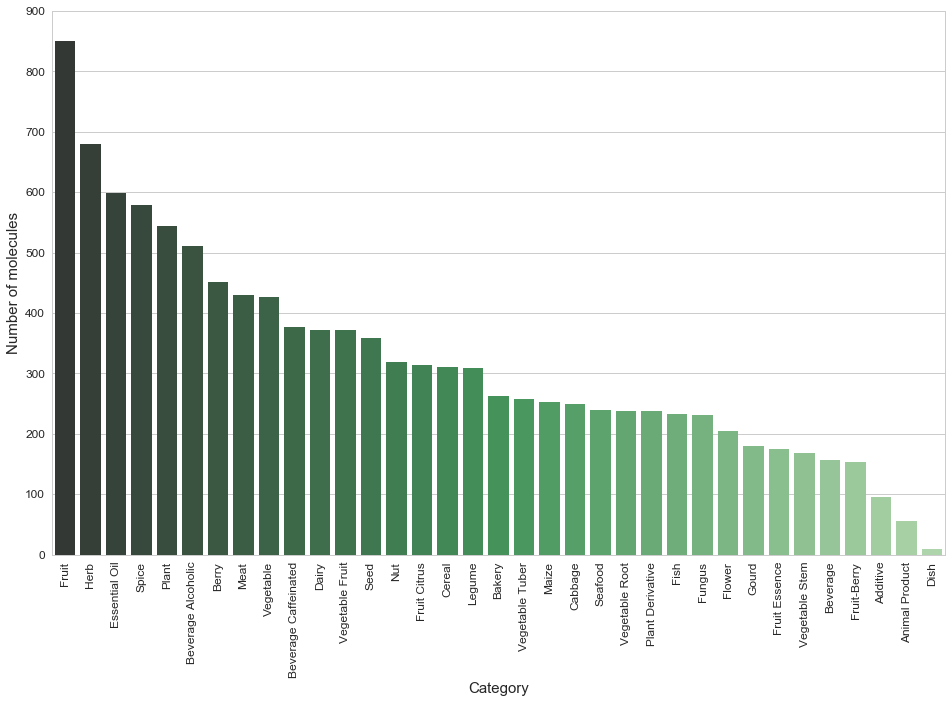

In [158]:
plt.figure(figsize=(16,10))
sns.barplot(data=catg2molcount, x='category', y='fdb_molecules_id', palette="Greens_d")
plt.xticks(rotation=90)
plt.xlabel('Category')
plt.ylim(0,900)
plt.ylabel('Number of molecules')

##### Barchart - Number of molecules for each natural source

In [160]:
natsource2molcount = entmol.groupby('natural_source').agg(lambda s: len(set(s)))[['fdb_molecules_id']]
natsource2molcount.reset_index(inplace=True)
natsource2molcount.sort_values('fdb_molecules_id', ascending=False, inplace=True)

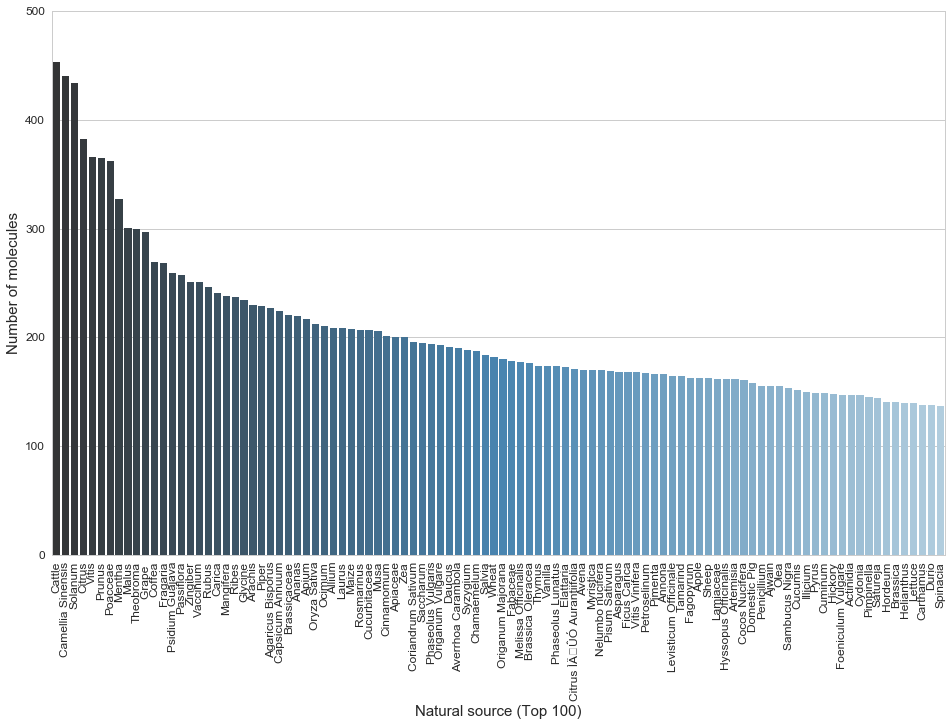

In [162]:
plt.figure(figsize=(16,10))
sns.barplot(data=natsource2molcount.iloc[0:100], x='natural_source', y='fdb_molecules_id', palette="Blues_d")
plt.xticks(rotation=90)
plt.xlabel('Natural source (Top 100)')
plt.ylim(0,500)
plt.ylabel('Number of molecules')

## Lower dimensional visualizations

##### Entities

In [189]:
# Create mappings from molecule to standard id and same for entities.
mol2idnum = {mol:id_num for id_num,mol in enumerate(set(entmol['fdb_molecules_id']))}
ent2idnum = {ent:id_num for id_num,ent in enumerate(set(entmol['fdb_entities_id']))}
idnum2ent = {id_num:ent for ent,id_num in ent2idnum.items()}

# Create a list for one hot encoded mappings
entid2mol = np.zeros((len(set(entmol['fdb_entities_id'])), len(mol2idnum)))

for i,row in entmol.iterrows():
    entid2mol[ent2idnum[row['fdb_entities_id']], mol2idnum[row['fdb_molecules_id']]] += 1
    
# Convert the list to dataframe
entid2mol = pd.DataFrame(entid2mol, dtype=int)
entid2mol.index = entid2mol.index.map(lambda s: entid2name[idnum2ent[s]])

##### Categories

##### Natural sources